<h1 align=center><font size = 5>Where to place a new accomodation business in the historic center of Rome?</font></h1>

In this notebook, I explore the neighborhoods of the 1st "Municipio" (equivalent to Borough) of Rome, Italy. This is the historic heart of the city and contains 22 Rioni (neighborhoods).
An enterpreneur wants to know which is the best location where to start a business regarding tourist accomodation; he needs a map showing the existing businesses around the Rioni and the tourist attractions distribution so to get a visual idea about a potentially "unworked" area. Furthermore, he wants to have a look at each Rione's top 10 most occurrent venues and to weight his final judgment with the demographics numbers so that, along with existing target businesses, he could have an idea of the number of private citizens living in the area and eventually renting out flats or rooms to tourists.

In [82]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files
import requests as rq
#!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
#import xml.etree.ElementTree as ET
#import urllib3
#from pykml import parser
# import k-means from clustering stage
from sklearn.cluster import KMeans
import re
#!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library
import seaborn as sb

print('Libraries imported.')

Libraries imported.


## Data gathering and cleaning

The data I am looking for are distributed over two sources. The former being a kml file taken from a custom map on google containing the geographical coordinates for each Rione, while the latter is a Wikipedia page containing info about the number of residents, area (expressed in squared kilometers) and population density (expressed in number of people per squared kilometer). Both report the names of the neighborhoods.

For the kml file, I decided not to use any specific kml/xml parsing library (as pykml,lxml,etc.) but parse the file by myself and get a suitable first dataframe.
A first look at the kml file in a text editor brought to my attention that all the data I need are inside "Placemark" tags.

In [83]:
url='https://www.google.com/maps/d/kml?mid=1N4VaYxeEiITMvyS3tXpREDFpSc8&forcekml=1'
kml_file = requests.get(url).text
result = re.findall('<Placemark>(.*?)</Placemark>', kml_file, re.DOTALL)
result

['\n        <name>Riga 1</name>\n        <styleUrl>#line-0000FF-5000-nodesc</styleUrl>\n        <LineString>\n          <tessellate>1</tessellate>\n          <coordinates>\n            12.48692,41.89715,0\n            12.4868,41.89768,0\n            12.48675,41.8988,0\n            12.48678,41.89897,0\n            12.48692,41.89916,0\n            12.48727,41.89952,0\n            12.49071,41.90197,0\n            12.49459,41.89976,0\n            12.49488,41.89965,0\n            12.49634,41.89882,0\n            12.49688,41.89818,0\n            12.49744,41.89766,0\n            12.4982,41.89704,0\n            12.49847,41.89691,0\n            12.498858,41.896951,0\n            12.49904,41.896911,0\n            12.499233,41.896767,0\n            12.49928,41.89661,0\n            12.50464,41.88709,0\n            12.50377,41.88622,0\n            12.50286,41.88561,0\n            12.50309,41.88342,0\n            12.5017,41.88339,0\n            12.50125,41.88333,0\n            12.49817,41.88243,0\n 

The content of some blocks through the file are not of interest. Their names are always beginning with "Riga" ("Line" in italian) and represent polygonal lines, contours of the neighborhoods. We will just skip them and preserve the blocks in which the names of the Rioni and their coordinates are.

In [84]:
result[:] = [x for x in result if "Riga" not in x]
#result
res_string = ''.join(result)
print(res_string)


        <name>R.I Monti</name>
        <styleUrl>#icon-503-DB4436-nodesc</styleUrl>
        <Point>
          <coordinates>
            12.495489,41.893556,0
          </coordinates>
        </Point>
      
        <name>R.II Trevi</name>
        <styleUrl>#icon-503-DB4436-nodesc</styleUrl>
        <Point>
          <coordinates>
            12.485104,41.899658,0
          </coordinates>
        </Point>
      
        <name>R.III Colonna</name>
        <styleUrl>#icon-503-DB4436-nodesc</styleUrl>
        <Point>
          <coordinates>
            12.480018,41.901718,0
          </coordinates>
        </Point>
      
        <name>R.IV Campo Marzio</name>
        <styleUrl>#icon-503-DB4436-nodesc</styleUrl>
        <Point>
          <coordinates>
            12.479482,41.907068,0
          </coordinates>
        </Point>
      
        <name>R.V Ponte</name>
        <styleUrl>#icon-503-DB4436-nodesc</styleUrl>
        <Point>
          <coordinates>
            12.46871,41.899993,0
 

We extract and clean the strings we need.

In [85]:
names = re.findall('<name>(.*?)</name>', res_string, re.DOTALL)
points= re.findall('<coordinates>(.*?)</coordinates>', res_string, re.DOTALL)
p_string = ''.join(points)
lons= re.findall('\n(.*?),', p_string, re.DOTALL)
lats= re.findall(',(.*?),', p_string, re.DOTALL)

This is the still uncleaned dataframe df1.

In [86]:
df1 = pd.DataFrame(list(zip(names, points)), columns =['Name', 'Coordinates']) 
df1

,Name,Coordinates
0,R.I Monti,"\n 12.495489,41.893556,0\n"
1,R.II Trevi,"\n 12.485104,41.899658,0\n"
2,R.III Colonna,"\n 12.480018,41.901718,0\n"
3,R.IV Campo Marzio,"\n 12.479482,41.907068,0\n"
4,R.V Ponte,"\n 12.46871,41.899993,0\n"
5,R.VI Parione,"\n 12.471778,41.897629,0\n"
6,R.VII Regola,"\n 12.471714,41.893205,0\n"
7,<![CDATA[R.VIII Sant'Eustacchio]]>,"\n 12.475297,41.898428,0\n"
8,R.IX Pigna,"\n 12.47931,41.896879,0\n"
9,R.X Campitelli,"\n 12.486134,41.888349,0\n"


Let's first separate our coordinates into latitude and longitude values over two different columns.

In [87]:
df1 = pd.DataFrame(list(zip(names, lats, lons)), columns =['Name', 'Latitude', 'Longitude']) 
df1

,Name,Latitude,Longitude
0,R.I Monti,41.893556,12.495489
1,R.II Trevi,41.899658,\n 12.485104
2,R.III Colonna,41.901718,\n 12.480018
3,R.IV Campo Marzio,41.907068,\n 12.479482
4,R.V Ponte,41.899993,\n 12.46871
5,R.VI Parione,41.897629,\n 12.471778
6,R.VII Regola,41.893205,\n 12.471714
7,<![CDATA[R.VIII Sant'Eustacchio]]>,41.898428,\n 12.475297
8,R.IX Pigna,41.896879,\n 12.47931
9,R.X Campitelli,41.888349,\n 12.486134


From the above visual inspection, some further cleaning to refine the dataframe is necessary.

In [88]:
df1['Longitude'] = df1['Longitude'].str.replace('\n','')
df1['Latitude'] = df1['Latitude'].str.replace(' ','')
df1.loc[[7], ['Name']]= "R.VIII Sant'Eustacchio"
df1.loc[[10], ['Name']]= "R.XI Sant'Angelo"
df1

,Name,Latitude,Longitude
0,R.I Monti,41.893556,12.495489
1,R.II Trevi,41.899658,12.485104
2,R.III Colonna,41.901718,12.480018
3,R.IV Campo Marzio,41.907068,12.479482
4,R.V Ponte,41.899993,12.46871
5,R.VI Parione,41.897629,12.471778
6,R.VII Regola,41.893205,12.471714
7,R.VIII Sant'Eustacchio,41.898428,12.475297
8,R.IX Pigna,41.896879,12.47931
9,R.X Campitelli,41.888349,12.486134


That is it for the first dataframe. Now into the Wiki page containing the needed data left. By inspecting the html code of the page, we gather that the second table of the list output by the Pandas.read_html method is what we are looking for. Again, a visual inspection indicates the cleaning steps needed.

In [89]:
tables = pd.read_html('https://it.wikipedia.org/wiki/Rioni_di_Roma', header=0,
                    keep_default_na=False)

df2=tables[1]
df2=df2.drop(['Stemma','Numero','Nome','Circoscrizione','Mappa'], axis=1)
df2=df2.drop([22], axis=0)
df2.rename(columns={'Popolazione[4]':'Population'}, inplace=True)
df2.rename(columns={'Superficie':'Area(Km2)'}, inplace=True)
df2.rename(columns={'Densità':'DensityPerKm2'}, inplace=True)
df2['Population'] = df2['Population'].str.replace('.', '')
df2['Area(Km2)'] = df2['Area(Km2)'].str.replace(' ', '')
df2['Area(Km2)'] = df2['Area(Km2)'].str[:-3]
df2['Area(Km2)'] = df2['Area(Km2)'].str.replace(',', '.')
df2['DensityPerKm2'] = df2['DensityPerKm2'].str.replace(' ', '')
df2['DensityPerKm2'] = df2['DensityPerKm2'].str[:-7]
df2['DensityPerKm2'] = df2['DensityPerKm2'].str.replace('.', '')
df2['DensityPerKm2'] = df2['DensityPerKm2'].str.replace(',', '.')

df2

,Population,Area(Km2),DensityPerKm2
0,13028,1.6508,7891.93
1,2327,0.5503,4228.6
2,2111,0.2689,7850.5
3,5860,0.8817,6646.25
4,3596,0.3189,11276.26
5,2572,0.1938,13271.41
6,3238,0.3189,10153.65
7,1962,0.1688,11623.22
8,10737,0.2063,52045.56
9,552,0.5990,921.54


Now that we have the two dataframes from the two different sources, we can merge them.

In [90]:
df=pd.concat([df1,df2],axis=1)

df

,Name,Latitude,Longitude,Population,Area(Km2),DensityPerKm2
0,R.I Monti,41.893556,12.495489,13028,1.6508,7891.93
1,R.II Trevi,41.899658,12.485104,2327,0.5503,4228.6
2,R.III Colonna,41.901718,12.480018,2111,0.2689,7850.5
3,R.IV Campo Marzio,41.907068,12.479482,5860,0.8817,6646.25
4,R.V Ponte,41.899993,12.46871,3596,0.3189,11276.26
5,R.VI Parione,41.897629,12.471778,2572,0.1938,13271.41
6,R.VII Regola,41.893205,12.471714,3238,0.3189,10153.65
7,R.VIII Sant'Eustacchio,41.898428,12.475297,1962,0.1688,11623.22
8,R.IX Pigna,41.896879,12.47931,10737,0.2063,52045.56
9,R.X Campitelli,41.888349,12.486134,552,0.5990,921.54


A conversion from strings to reals is needed for the geocoordinates to work properly inside the map visualization.

In [91]:
convert_dict = {'Latitude': float, 
                'Longitude': float,
                'Population': int, 
                'Area(Km2)': float,
                'DensityPerKm2': float} 
  
df = df.astype(convert_dict)

In [92]:
#check all data types are good
df.dtypes

Name              object
Latitude         float64
Longitude        float64
Population         int32
Area(Km2)        float64
DensityPerKm2    float64
dtype: object

#### Use geopy library to get the latitude and longitude values of Rome.

In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent <em>rm_explorer</em>, as shown below.

In [93]:
address = 'Rome,Italy'

geolocator = Nominatim(user_agent="rm_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Rome are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Rome are 41.8933203, 12.4829321.


#### Create a map of Rome with neighborhoods markers superimposed on top.

In [94]:
# create map of Rome using latitude and longitude values
map_rome = folium.Map(location=[latitude, longitude], zoom_start=12)


# add markers to map
for lat, lng, name, pop in zip(df['Latitude'], df['Longitude'], df['Name'], df['Population']):
    label = '{}, {} people'.format(name, pop)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_rome)  
    


In [95]:
map_rome

Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.

#### Define Foursquare Credentials and Version

In [96]:
CLIENT_ID = '2HVMWOBFVZ3HZMQ2DHBXCCU44EX0TSBIHEE3FMSONRK2WLND' # your Foursquare ID
CLIENT_SECRET = 'PKBXDMT3IOY2NCHCGYIUJEOT13PGTP0Z00SMFJPKRPTI3F4C' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentials:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentials:
CLIENT_ID: 2HVMWOBFVZ3HZMQ2DHBXCCU44EX0TSBIHEE3FMSONRK2WLND
CLIENT_SECRET:PKBXDMT3IOY2NCHCGYIUJEOT13PGTP0Z00SMFJPKRPTI3F4C


#### Let's explore the first neighborhood in our dataframe.

Get the neighborhood's name.

In [97]:
df.loc[0, 'Name']

'R.I Monti'

Get the neighborhood's latitude and longitude values.

In [98]:
rione_latitude = df.loc[0, 'Latitude'] # neighborhood latitude value
rione_longitude = df.loc[0, 'Longitude'] # neighborhood longitude value

rione_name = df.loc[0, 'Name'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(rione_name, 
                                                               rione_latitude, 
                                                               rione_longitude))

Latitude and longitude values of R.I Monti are 41.893556, 12.495489.


#### Now, let's get the top 100 venues that are in Monti within a radius of 500 meters.

First, let's create the GET request URL. Name your URL **url**.

In [99]:
LIMIT=100
radius=500
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius, 
    LIMIT)

url 


'https://api.foursquare.com/v2/venues/explore?&client_id=2HVMWOBFVZ3HZMQ2DHBXCCU44EX0TSBIHEE3FMSONRK2WLND&client_secret=PKBXDMT3IOY2NCHCGYIUJEOT13PGTP0Z00SMFJPKRPTI3F4C&v=20180605&ll=41.8933203,12.4829321&radius=500&limit=100'

Double-click __here__ for the solution.
<!-- The correct answer is:
LIMIT = 100 # limit of number of venues returned by Foursquare API
-->

<!--
radius = 500 # define radius
-->

<!--
\\ # create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # display URL
--> 

Send the GET request and examine the resutls

In [100]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5ebb9e5771c428001bc68326'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'With specials', 'key': 'specials'},
    {'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Rome',
  'headerFullLocation': 'Rome',
  'headerLocationGranularity': 'city',
  'totalResults': 65,
  'suggestedBounds': {'ne': {'lat': 41.8978203045, 'lng': 12.488966042024316},
   'sw': {'lat': 41.8888202955, 'lng': 12.476898157975683}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4adcdac7f964a5209f5321e3',
       'name': 'Piazza del Campidoglio',
       'location': {'address': 'Piazza del Campidoglio',
        'lat': 41.89332137812433,
        'lng': 12.482955747846482,
        'labeledLatLngs': [{'label': 'display

From the Foursquare lab in the previous module, we know that all the information is in the *items* key. Before we proceed, let's borrow the **get_category_type** function from the Foursquare lab.

In [101]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Now we are ready to clean the json and structure it into a *pandas* dataframe.

In [102]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)
nearby_venues.columns= ['Name','Category','Latitude','Longitude']

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]



nearby_venues.head()


,Name,Category,Latitude,Longitude
0,Piazza del Campidoglio,Plaza,41.893321,12.482956
1,Terrazza delle Quadrighe,Scenic Lookout,41.894346,12.483336
2,Foro di Cesare,Historic Site,41.894128,12.485232
3,Foro di Traiano,Historic Site,41.894729,12.484871
4,Teatro Della Cometa,Theater,41.893399,12.481593


And how many venues were returned by Foursquare?

In [103]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

65 venues were returned by Foursquare.


<a id='item2'></a>

## Explore the 22 Rioni in the center of Rome

Let's create a function to repeat the same process to all the neighborhoods

In [104]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()['response']['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Rione', 
                  'Rione Latitude', 
                  'Rione Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Now write the code to run the above function on each neighborhood and create a new dataframe called *rome_venues*.

In [105]:
rome_venues = getNearbyVenues(names=df['Name'],latitudes=df['Latitude'],longitudes=df['Longitude'])



R.I Monti
R.II Trevi
R.III Colonna
R.IV Campo Marzio
R.V Ponte
R.VI Parione
R.VII Regola
R.VIII Sant'Eustacchio
R.IX Pigna
R.X Campitelli
R.XI Sant'Angelo
R.XII Ripa
R.XIII Trastevere
R.XIV Borgo
R.XV Esquilino
R.XVI Ludovisi
R.XVII Sallustiano
R.XVIII Castro Pretorio
R.XIX Celio
R.XX Testaccio
R.XXI San Saba
R.XXII Prati


Let's check the size of the resulting dataframe

In [106]:
print(rome_venues.shape)
#rome_venues

(1612, 7)


How many unique categories can be curated from all the returned venues?

In [107]:
print('There are {} uniques categories.'.format(len(rome_venues['Venue Category'].unique())))

There are 145 uniques categories.


#### Let's create two needed dataframe and visualize target businesses and touristic points of interests on map

In [109]:
target_bus= rome_venues
tar = ["Hotel", "Bed & Breakfast", "Hostel"]
tar_filter = target_bus['Venue Category'].str.contains(r'\b(?:{})\b'.format('|'.join(tar)))
target_bus = target_bus[tar_filter]
target_bus

,Rione,Rione Latitude,Rione Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,R.I Monti,41.893556,12.495489,Montipalace Hotel,41.895384,12.493839,Hotel
16,R.I Monti,41.893556,12.495489,Palazzo Manfredi,41.890264,12.495584,Hotel
21,R.I Monti,41.893556,12.495489,New Generation Hostel Santa Maria Maggiore,41.895517,12.497102,Hostel
23,R.I Monti,41.893556,12.495489,Relais Monti,41.896606,12.494637,Bed & Breakfast
28,R.I Monti,41.893556,12.495489,The Fifteen Keys Hotel,41.897646,12.495529,Hotel
30,R.I Monti,41.893556,12.495489,Hotel Raffaello,41.897770,12.495622,Hotel
46,R.I Monti,41.893556,12.495489,Hotel Colosseum,41.896050,12.496070,Hotel
58,R.I Monti,41.893556,12.495489,Auditorium Di Mecenate,41.894847,12.501266,Hotel
67,R.I Monti,41.893556,12.495489,Mercure Roma Centro Colosseo,41.890060,12.498122,Hotel
81,R.I Monti,41.893556,12.495489,Marta bed and breakfast,41.896068,12.500135,Bed & Breakfast


In [110]:
# create map of Rome using latitude and longitude values
map_hotel = folium.Map(location=[latitude, longitude], zoom_start=13)


# add markers to map
for lat, lng, name, rio in zip(target_bus['Venue Latitude'], target_bus['Venue Longitude'], target_bus['Venue'], target_bus['Rione']):
    label = '{}({})'.format(name, rio)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_hotel)  
map_hotel  

In [111]:
tour_poi= rome_venues
tour = ["Art", "Museum", "Plaza", "Historic", "Scenic", "Temple", "Fountain", "Monument", "Building", "Church", "Outdoors"]
tour_filter = tour_poi['Venue Category'].str.contains(r'\b(?:{})\b'.format('|'.join(tour)))
tour_poi = tour_poi[tour_filter]
tour_poi
#target_bus=target_bus.drop(['Stemma','Numero','Nome','Circoscrizione','Mappa'], axis=1)

,Rione,Rione Latitude,Rione Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
2,R.I Monti,41.893556,12.495489,Mosè di Michelangelo,41.893681,12.492548,Public Art
5,R.I Monti,41.893556,12.495489,Piazza San Martino ai Monti,41.895174,12.497192,Plaza
7,R.I Monti,41.893556,12.495489,Domus Aurea,41.894033,12.495643,Historic Site
15,R.I Monti,41.893556,12.495489,Piazza del Colosseo,41.890458,12.493386,Plaza
17,R.I Monti,41.893556,12.495489,Via Urbana,41.894076,12.495628,Outdoors & Recreation
19,R.I Monti,41.893556,12.495489,Colosseo,41.890633,12.492378,Historic Site
24,R.I Monti,41.893556,12.495489,Piazza della Madonna dei Monti,41.894963,12.490825,Plaza
25,R.I Monti,41.893556,12.495489,Palazzo Brancaccio,41.894819,12.500205,Building
29,R.I Monti,41.893556,12.495489,Basilica dei Santi Silvestro e Martino ai Monti,41.894588,12.498246,Church
65,R.I Monti,41.893556,12.495489,"Museo Nazionale d'Arte Orientale ""G. Tucci""",41.894473,12.500453,Art Museum


In [112]:
# create map of Rome using latitude and longitude values
map_tour = folium.Map(location=[latitude, longitude], zoom_start=13)


# add markers to map
for lat, lng, name, rio in zip(tour_poi['Venue Latitude'], tour_poi['Venue Longitude'], tour_poi['Venue'], tour_poi['Rione']):
    label = '{}({})'.format(name, rio)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='black',
        fill=True,
        fill_color='black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_tour)  
map_tour

Now let's prepare the target businesses dataframe for the k-means clustering and verify the optimal choice of k.

In [113]:
target_bus_clustering= target_bus[['Venue Latitude','Venue Longitude']]
sq_dist_sum=[]
K=range(1,23)
for k in K:
    print(k,end=' ')
    kmeans=KMeans(n_clusters=k).fit(target_bus_clustering)
    sq_dist_sum.append(kmeans.inertia_)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 

Text(0.5, 1.0, 'Elbow Method for optimal K')

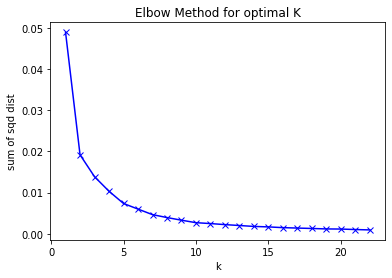

In [114]:
plt.plot(K,sq_dist_sum, 'bx-')
plt.xlabel('k')
plt.ylabel('sum of sqd dist')
plt.title('Elbow Method for optimal K')

The Elbow method already gives us a neat response but to analyze this further, we decide to use the Silhouette Score method as well.

In [115]:
from sklearn.metrics import silhouette_score
sil=[]
K_sil=range(2,20)
for k in K_sil:
    print(k,end=' ')
    kmeans=KMeans(n_clusters=k).fit(target_bus_clustering)
    labels=kmeans.labels_
    sil.append(silhouette_score(target_bus_clustering,labels,metric='euclidean'))

2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 

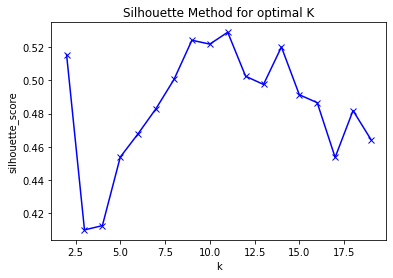

In [116]:
plt.plot(K_sil,sil,'bx-')
plt.xlabel('k')
plt.ylabel('silhouette_score')
plt.title('Silhouette Method for optimal K')
plt.show()

## Cluster Target Businesses

Since the clustering would only give us a visual grouped distribution of the target businesses, we do not stricly rely on the anyway useful methods above, and decide to set the number of clusters to 10.

In [117]:
# set number of clusters
k = 10

# run k-means clustering
kmeans = KMeans(n_clusters=k, random_state=0).fit(target_bus_clustering)

# check cluster labels generated for each row in the dataframe
len(kmeans.labels_)
#[0:10] 
target_bus_clustering

,Venue Latitude,Venue Longitude
0,41.895384,12.493839
16,41.890264,12.495584
21,41.895517,12.497102
23,41.896606,12.494637
28,41.897646,12.495529
30,41.897770,12.495622
46,41.896050,12.496070
58,41.894847,12.501266
67,41.890060,12.498122
81,41.896068,12.500135


Let's append the cluster labels to our dataframe so to have the possibility to visualize this on Folium.

In [118]:
# add clustering labels
target_bus_clustering.insert(0, 'Cluster Labels', kmeans.labels_)

In [119]:
tb_final= pd.concat([target_bus[['Rione','Venue','Venue Category']],target_bus_clustering],axis=1)

tb_final

,Rione,Venue,Venue Category,Cluster Labels,Venue Latitude,Venue Longitude
0,R.I Monti,Montipalace Hotel,Hotel,0,41.895384,12.493839
16,R.I Monti,Palazzo Manfredi,Hotel,0,41.890264,12.495584
21,R.I Monti,New Generation Hostel Santa Maria Maggiore,Hostel,0,41.895517,12.497102
23,R.I Monti,Relais Monti,Bed & Breakfast,0,41.896606,12.494637
28,R.I Monti,The Fifteen Keys Hotel,Hotel,0,41.897646,12.495529
30,R.I Monti,Hotel Raffaello,Hotel,0,41.897770,12.495622
46,R.I Monti,Hotel Colosseum,Hotel,0,41.896050,12.496070
58,R.I Monti,Auditorium Di Mecenate,Hotel,6,41.894847,12.501266
67,R.I Monti,Mercure Roma Centro Colosseo,Hotel,0,41.890060,12.498122
81,R.I Monti,Marta bed and breakfast,Bed & Breakfast,0,41.896068,12.500135


In [120]:
# create map
map_tb_clusters = folium.Map(location=[latitude, longitude], zoom_start=13)

# set color scheme for the clusters
colors=['blue','red','green','purple','darkblue','darkred','darkgreen','gray','cadetblue','orange']

# add markers to the map
for lat, lon, cluster, name, cat in zip(tb_final['Venue Latitude'], tb_final['Venue Longitude'],tb_final['Cluster Labels'], tb_final['Venue'], tb_final['Venue Category']):
    label = folium.Popup(str(name) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=colors[cluster],
        fill=True,
        fill_color=colors[cluster],
        fill_opacity=0.7).add_to(map_tb_clusters)
       
map_tb_clusters

To have a clearer view of the edges between clusters, we choose to draw a Voronoi diagram and superimpose it to the map.

In [121]:
#we get the clusters centroids
points=np.array(kmeans.cluster_centers_)
points

array([[41.89373048, 12.49641241],
       [41.89735992, 12.47352701],
       [41.90591765, 12.50095154],
       [41.90040316, 12.46150358],
       [41.90731951, 12.49186089],
       [41.90125589, 12.4850134 ],
       [41.89398417, 12.50547758],
       [41.88412753, 12.4775491 ],
       [41.91051017, 12.4665481 ],
       [41.90800362, 12.4778363 ]])

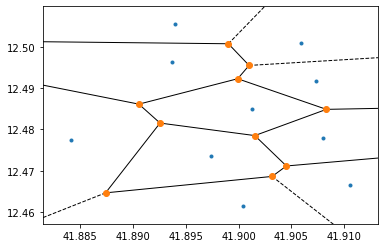

In [122]:
import scipy as sp
from scipy.spatial import Voronoi, voronoi_plot_2d
vor= Voronoi(points)

voronoi_plot_2d(vor)
plt.show()

So this is what our cluster look like when closed inside sectors, the Voronoi cells. We can see the centroids represented as blue dots, sectors vertices as yellow dots and sectors edges as continous lines, but we also notice the presence of dashed lines, indicating that some sectors are not closed (the dashed line is an infinite line ad not a side of the polygonal sector).
Therefore, we may want to set a <b>bounding_box</b> that artificially gives an end to those lines.

In [123]:
#topleft,topright,bottomright,bottomleft
bounding_box=[(41.915209, 12.453009),(41.914487, 12.511455),(41.883274, 12.501886), (41.883836, 12.454642)]
#lat_min,lat_max,lon_min,lon_max
box=[bounding_box[3][0],bounding_box[1][0],bounding_box[3][1],bounding_box[1][1]]

To plot the Voronoi Diagram, we have to build a function that could integrate the above bounds to the figure.

In [124]:
def voronoi(towers, bounding_box):
    points_center=towers
    # Mirror points
    points_left = np.copy(points_center)
    points_left[:, 0] = bounding_box[0] - (points_left[:, 0] - bounding_box[0])
    points_right = np.copy(points_center)
    points_right[:, 0] = bounding_box[1] + (bounding_box[1] - points_right[:, 0])
    points_down = np.copy(points_center)
    points_down[:, 1] = bounding_box[2] - (points_down[:, 1] - bounding_box[2])
    points_up = np.copy(points_center)
    points_up[:, 1] = bounding_box[3] + (bounding_box[3] - points_up[:, 1])
    points = np.append(points_center,
                       np.append(np.append(points_left,
                                           points_right,
                                           axis=0),
                                 np.append(points_down,
                                           points_up,
                                           axis=0),
                                 axis=0),
                       axis=0)
    vor = sp.spatial.Voronoi(points)
    vor.filtered_regions = np.array(vor.regions)[vor.point_region[:vor.npoints//5]]
    vor.filtered_points = points_center
    return vor

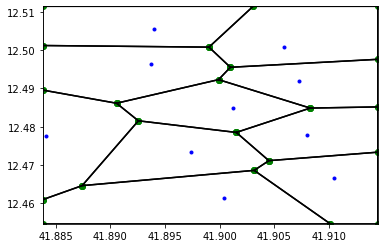

In [125]:
import sys
eps = sys.float_info.epsilon
vor=voronoi(points,box)
fig = plt.figure()
ax = fig.gca()
# Plot initial points
ax.plot(vor.filtered_points[:, 0], vor.filtered_points[:, 1], 'b.')
# Plot ridges points
for region in vor.filtered_regions:
    vertices = vor.vertices[region, :]
    ax.plot(vertices[:, 0], vertices[:, 1], 'go')
# Plot ridges
for region in vor.filtered_regions:
    vertices = vor.vertices[region + [region[0]], :]
    ax.plot(vertices[:, 0], vertices[:, 1], 'k-')

ax.set_xlim(box[0], box[1])
ax.set_ylim(box[2],box[3])
plt.show()
#plt.savefig("bounded_voronoi.png")
#plt.savefig("voronoi.png")

Now that we have the sectors all bounded, we can get back the clustering map we saw before and superimpose the diagram just getting the sectors boundaries.

In [126]:
map_final=map_tb_clusters

In [127]:
for region in vor.filtered_regions:
    vertices = vor.vertices[region + [region[0]], :]
    vert=list(map(tuple, vertices))
    folium.PolyLine(vert, color="black", weight=1.5, opacity=0.7).add_to(map_final)
    

And we also add the points of interests back so to have a complete picture.

In [128]:
for lat, lng, name, rio in zip(tour_poi['Venue Latitude'], tour_poi['Venue Longitude'], tour_poi['Venue'], tour_poi['Rione']):
    label = '{}({})'.format(name, rio)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=1,
        popup=label,
        color='black',
        fill=True,
        fill_color='black',
        fill_opacity=0.7,
        parse_html=False).add_to(map_final) 

In [129]:
map_final

Simply by visually inspecting this map (even though lots of further computed analyses could be done) the entrepreneur decides to set his potential new business in a specific region between Rione Campitelli and Rione Sant'Angelo. This optimal zone is then added to the map.

In [130]:
lat=41.893733
lng=12.480089
label = 'Optimal Zone'
label = folium.Popup(label, parse_html=True)
folium.Circle(
    [lat, lng],
    radius=200,
    popup=label,
    color='red',
    fill=True,
    fill_color='red',
    fill_opacity=0.2,
    parse_html=False).add_to(map_final) 

In [131]:
map_final

<a id='item3'></a>

## Final Valutations

The entrepreneur is pretty satisfied by the analyses done until now. He clearly saw how that area between the two above-cited neighborhoods of Central Rome could be the target location of his investment because of the vicinity to the majority of touristic p.o.i. and the relative scarcity of hotels or similar businesses. Moreover, its position is really more central with respect to other sparse areas around our bounding box. One final factor influencing the decision is the proximity to the Train Central Station of Termini (you can see it in between two green clusters on the right. Close enough to it to allow fast shuttling between it and his business but not so close to it to be overwhelmed by all the concurrency nearby. Also, in that case the tourist attractions would have been really further away and not pleasably reached on foot.
Nevertheless, the entrepreneur would like to have a glance at some final information about number of specific venues inside the Rioni and around his optimal zone, other than retrieving some general demographics and gather if his chosen area would be more "immune" than others to privates renting out their own places or parts of them.

First of all, a rapid look at the 5 and 10 most common venues in each Rione is requested, and even if we could have just counted the venues from the <b>rome_venues</b> dataframe built before, we would like to convert that into a "one-hot-encoded" new dataframe
that could serve for some afterthoughts of the entrepreneur being translated into analysis.

In [132]:
# one hot encoding
rome_onehot = pd.get_dummies(rome_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
rome_onehot['Rione'] = rome_venues['Rione'] 

# move neighborhood column to the first column
fixed_columns = [rome_onehot.columns[-1]] + list(rome_onehot.columns[:-1])
rome_onehot = rome_onehot[fixed_columns]

rome_onehot

,Rione,Abruzzo Restaurant,Accessories Store,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Bakery,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bistro,Boarding House,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Building,Burger Joint,Bus Stop,Cafeteria,Café,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Cosmetics Shop,Courthouse,Creperie,Cupcake Shop,Deli / Bodega,Dessert Shop,Diner,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Festival,Filipino Restaurant,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Fountain,French Restaurant,Friterie,Furniture / Home Store,Garden,Gastropub,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Gym,Gym / Fitness Center,Halal Restaurant,Health Food Store,Historic Site,History Museum,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Korean Restaurant,Lebanese Restaurant,Lingerie Store,Lounge,Market,Mediterranean Restaurant,Men's Store,Metro Station,Middle Eastern Restaurant,Monument / Landmark,Museum,Nightclub,Opera House,Other Nightlife,Outdoors & Recreation,Park,Pastry Shop,Performing Arts Venue,Peruvian Restaurant,Pet Store,Piano Bar,Pie Shop,Pizza Place,Platform,Plaza,Pub,Public Art,Radio Station,Record Shop,Resort,Restaurant,Road,Roman Restaurant,Roof Deck,Salad Place,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Mall,Sicilian Restaurant,Snack Place,Spa,Speakeasy,Sporting Goods Shop,Steakhouse,Supermarket,Sushi Restaurant,Tea Room,Temple,Theater,Theme Park Ride / Attraction,Toy / Game Store,Track Stadium,Train Station,Trattoria/Osteria,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,Winery
0,R.I Monti,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,R.I Monti,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,R.I Monti,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,R.I Monti,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,R.I Monti,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,R.I Monti,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,R.I Monti,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

And let's examine the new dataframe size.

In [133]:
rome_onehot.shape

(1612, 146)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [134]:
rome_grouped = rome_onehot.groupby('Rione').mean().reset_index()
rome_grouped

,Rione,Abruzzo Restaurant,Accessories Store,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Bakery,Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bistro,Boarding House,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Bubble Tea Shop,Building,Burger Joint,Bus Stop,Cafeteria,Café,Castle,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,Comfort Food Restaurant,Concert Hall,Cosmetics Shop,Courthouse,Creperie,Cupcake Shop,Deli / Bodega,Dessert Shop,Diner,Electronics Store,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Festival,Filipino Restaurant,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Fountain,French Restaurant,Friterie,Furniture / Home Store,Garden,Gastropub,German Restaurant,Gift Shop,Gluten-free Restaurant,Gourmet Shop,Greek Restaurant,Gym,Gym / Fitness Center,Halal Restaurant,Health Food Store,Historic Site,History Museum,Hostel,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Juice Bar,Korean Restaurant,Lebanese Restaurant,Lingerie Store,Lounge,Market,Mediterranean Restaurant,Men's Store,Metro Station,Middle Eastern Restaurant,Monument / Landmark,Museum,Nightclub,Opera House,Other Nightlife,Outdoors & Recreation,Park,Pastry Shop,Performing Arts Venue,Peruvian Restaurant,Pet Store,Piano Bar,Pie Shop,Pizza Place,Platform,Plaza,Pub,Public Art,Radio Station,Record Shop,Resort,Restaurant,Road,Roman Restaurant,Roof Deck,Salad Place,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shoe Store,Shopping Mall,Sicilian Restaurant,Snack Place,Spa,Speakeasy,Sporting Goods Shop,Steakhouse,Supermarket,Sushi Restaurant,Tea Room,Temple,Theater,Theme Park Ride / Attraction,Toy / Game Store,Track Stadium,Train Station,Trattoria/Osteria,Vegetarian / Vegan Restaurant,Wine Bar,Wine Shop,Winery
0,R.I Monti,0.00,0.000000,0.000000,0.000000,0.000000,0.012195,0.000000,0.00,0.000000,0.036585,0.024390,0.024390,0.012195,0.00,0.012195,0.000000,0.012195,0.000000,0.000000,0.00000,0.000000,0.000000,0.00,0.000000,0.012195,0.000000,0.000000,0.00,0.085366,0.00,0.00,0.012195,0.000000,0.012195,0.000000,0.024390,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.024390,0.000000,0.000000,0.012195,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.000000,0.012195,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.024390,0.000000,0.012195,0.085366,0.000000,0.073171,0.000000,0.012195,0.134146,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.024390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012195,0.012195,0.012195,0.000000,0.000000,0.000000,0.000000,0.00,0.060976,0.000000,0.036585,0.024390,0.012195,0.00,0.000000,0.000000,0.024390,0.000000,0.012195,0.012195,0.012195,0.024390,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.000000,0.000000,0.000000,0.012195,0.00,0.000000,0.012195,0.000000,0.000000,0.00,0.000000,0.012195,0.000000,0.012195,0.000000,0.000000
1,R.II Trevi,0.00,0.000000,0.000000,0.000000,0.010989,0.043956,0.000000,0.00,0.000000,0.000000,0.000000,0.010989,0.000000,0.00,0.000000,0.000000,0.010989,0.010989,0.021978,0.00000,0.000000,0.010989,0.00,0.000000,0.000000,0.000000,0.000000,0.00,0.010989,0.00,0.00,0.010989,0.000000,0.010989,0.010989,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.00,0.00,0.000000,0.021978,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,0.010989,0.000000,0.000000,0.010989,0.000000,0.00,0.010989,0.000000,0.000000,0.000000,0.00,0.000000,0.010989,0.000000,0.000000,0.000000,0.00,0.00,0.021978,0.021978,0.000000,0.120879,0.000000,0.087912,0.000000,0.000000,0.164835,0.000000,0.000000,0.000000,0.000000,0.000000,0.010989,0.010989,0.000000,0.000000,0.000000,0.000000,0.000000,0.043956,0.032967,0.00

#### Let's confirm the new size

In [135]:
rome_grouped.shape

(22, 146)

#### Top 5 most common venues

In [136]:
num_top_venues = 5

for rione in rome_grouped['Rione']:
    print("----"+rione+"----")
    temp = rome_grouped[rome_grouped['Rione'] == rione].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----R.I Monti----
                venue  freq
0  Italian Restaurant  0.13
1                Café  0.09
2               Hotel  0.09
3      Ice Cream Shop  0.07
4         Pizza Place  0.06


----R.II Trevi----
                venue  freq
0  Italian Restaurant  0.16
1               Hotel  0.12
2               Plaza  0.10
3      Ice Cream Shop  0.09
4      Sandwich Place  0.05


----R.III Colonna----
                venue  freq
0  Italian Restaurant  0.20
1               Hotel  0.12
2      Ice Cream Shop  0.08
3      Sandwich Place  0.05
4               Plaza  0.05


----R.IV Campo Marzio----
                venue  freq
0  Italian Restaurant  0.17
1               Hotel  0.14
2               Plaza  0.07
3      Ice Cream Shop  0.06
4            Boutique  0.06


----R.IX Pigna----
                 venue  freq
0   Italian Restaurant  0.16
1                Plaza  0.15
2       Ice Cream Shop  0.06
3  Monument / Landmark  0.06
4               Church  0.05


----R.V Ponte----
                venue 

Interestingly enough, the 5 most common venues throughout all of the Rioni but the two chosen for the optimal zone (Campitelli and Sant'Angelo) have a massive presence of Italian Restaurants, Cafès, Ice-Cream Shops and Hotels. These latters instead show a great countertrend having mostly historic sites at the top occurence frequency and very low number of accomodations.
We extend the investigation to have a look at the top 10 most common venues.

#### Let's put that into a *pandas* dataframe

First, let's write a function to sort the venues in descending order.

In [138]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [139]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Rione']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
rioni_venues_sorted = pd.DataFrame(columns=columns)
rioni_venues_sorted['Rione'] = rome_grouped['Rione']

for ind in np.arange(rome_grouped.shape[0]):
    rioni_venues_sorted.iloc[ind, 1:] = return_most_common_venues(rome_grouped.iloc[ind, :], num_top_venues)

rioni_venues_sorted

,Rione,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,R.I Monti,Italian Restaurant,Café,Hotel,Ice Cream Shop,Pizza Place,Bakery,Plaza,Sandwich Place,Pub,Bed & Breakfast
1,R.II Trevi,Italian Restaurant,Hotel,Plaza,Ice Cream Shop,Sandwich Place,Art Museum,Monument / Landmark,Museum,Pizza Place,History Museum
2,R.III Colonna,Italian Restaurant,Hotel,Ice Cream Shop,Sandwich Place,Boutique,Plaza,Pizza Place,Restaurant,Fountain,Bed & Breakfast
3,R.IV Campo Marzio,Italian Restaurant,Hotel,Plaza,Boutique,Ice Cream Shop,Fountain,Café,Historic Site,Cosmetics Shop,Accessories Store
4,R.IX Pigna,Italian Restaurant,Plaza,Monument / Landmark,Ice Cream Shop,Church,Pizza Place,Sandwich Place,Hotel,Dessert Shop,Trattoria/Osteria
5,R.V Ponte,Italian Restaurant,Hotel,Ice Cream Shop,Restaurant,Wine Bar,Roman Restaurant,Plaza,Sandwich Place,Trattoria/Osteria,Fountain
6,R.VI Parione,Italian Restaurant,Hotel,Plaza,Sandwich Place,Wine Bar,Dessert Shop,Ice Cream Shop,Restaurant,Art Museum,Fountain
7,R.VII Regola,Italian Restaurant,Plaza,Pizza Place,Ice Cream Shop,Hotel,Café,Sandwich Place,Bakery,Restaurant,Wine Bar
8,R.VIII Sant'Eustacchio,Italian Restaurant,Hotel,Plaza,Ice Cream Shop,Sandwich Place,Wine Bar,Fountain,Dessert Shop,Bistro,Roman Restaurant
9,R.X Campitelli,Historic Site,Temple,Monument / Landmark,Italian Restaurant,Café,Hotel,Garden,Cocktail Bar,Fountain,Clothing Store


And attach columns regarding demographics.

In [140]:
rome_merged = df
rome_merged = rome_merged.join(rioni_venues_sorted.set_index('Rione'), on='Name')
rome_merged 

,Name,Latitude,Longitude,Population,Area(Km2),DensityPerKm2,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,R.I Monti,41.893556,12.495489,13028,1.6508,7891.93,Italian Restaurant,Café,Hotel,Ice Cream Shop,Pizza Place,Bakery,Plaza,Sandwich Place,Pub,Bed & Breakfast
1,R.II Trevi,41.899658,12.485104,2327,0.5503,4228.60,Italian Restaurant,Hotel,Plaza,Ice Cream Shop,Sandwich Place,Art Museum,Monument / Landmark,Museum,Pizza Place,History Museum
2,R.III Colonna,41.901718,12.480018,2111,0.2689,7850.50,Italian Restaurant,Hotel,Ice Cream Shop,Sandwich Place,Boutique,Plaza,Pizza Place,Restaurant,Fountain,Bed & Breakfast
3,R.IV Campo Marzio,41.907068,12.479482,5860,0.8817,6646.25,Italian Restaurant,Hotel,Plaza,Boutique,Ice Cream Shop,Fountain,Café,Historic Site,Cosmetics Shop,Accessories Store
4,R.V Ponte,41.899993,12.468710,3596,0.3189,11276.26,Italian Restaurant,Hotel,Ice Cream Shop,Restaurant,Wine Bar,Roman Restaurant,Plaza,Sandwich Place,Trattoria/Osteria,Fountain
5,R.VI Parione,41.897629,12.471778,2572,0.1938,13271.41,Italian Restaurant,Hotel,Plaza,Sandwich Place,Wine Bar,Dessert Shop,Ice Cream Shop,Restaurant,Art Museum,Fountain
6,R.VII Regola,41.893205,12.471714,3238,0.3189,10153.65,Italian Restaurant,Plaza,Pizza Place,Ice Cream Shop,Hotel,Café,Sandwich Place,Bakery,Restaurant,Wine Bar
7,R.VIII Sant'Eustacchio,41.898428,12.475297,1962,0.1688,11623.22,Italian Restaurant,Hotel,Plaza,Ice Cream Shop,Sandwich Place,Wine Bar,Fountain,Dessert Shop,Bistro,Roman Restaurant
8,R.IX Pigna,41.896879,12.479310,10737,0.2063,52045.56,Italian Restaurant,Plaza,Monument / Landmark,Ice Cream Shop,Church,Pizza Place,Sandwich Place,Hotel,Dessert Shop,Trattoria/Osteria
9,R.X Campitelli,41.888349,12.486134,552,0.5990,921.54,Historic Site,Temple,Monument / Landmark,Italian Restaurant,Café,Hotel,Garden,Cocktail Bar,Fountain,Clothing Store


<a id='item5'></a>

This extended view reinforces the good feeling of the entrepreneur regarding his choice in terms of scarcity of existing accomodations in the two target neighborhoods. The relative small presence of restaurants other than italian ones goes in the same direction even if a more robust presence of traditional roman Osteria would have been appreciated.
From the demographic point of view puts instead our optimal zone in a low-medium class for number of residents and density over a squared kilometer, thus being very good to lower the private competition.

#### 1.Which Rione has the most venues?

In [27]:
rome_mostvenues=rome_venues.groupby('Rione').count()
rome_mostvenues=rome_mostvenues.filter(['Rione', 'Venue'])

rome_mostvenues.rename(columns={'Venue':'Count'}, inplace=True)
rome_mostvenues

,Count
Rione,
R.I Monti,83
R.II Trevi,91
R.III Colonna,92
R.IV Campo Marzio,69
R.IX Pigna,87
R.V Ponte,100
R.VI Parione,100
R.VII Regola,100
R.VIII Sant'Eustacchio,100


In [28]:
rome_mostvenues.loc[rome_mostvenues['Count'].idxmax()]

Count    100
Name: R.V Ponte, dtype: int64

#### 2.Which Rione has the most POI?

In [141]:
rome_mostpoi=tour_poi.filter(['Rione', 'Venue Category'])
rome_mostpoi.rename(columns={'Venue Category':'POI'}, inplace=True)

#rome_mostchurches=rome_mostchurches[rome_mostchurches.Churches.str.contains("Church")].reset_index(drop=True)
rome_mostpoi=rome_mostpoi.groupby('Rione').count()
rome_mostpoi

,POI
Rione,
R.I Monti,10
R.II Trevi,27
R.III Colonna,15
R.IV Campo Marzio,11
R.IX Pigna,29
R.V Ponte,11
R.VI Parione,14
R.VII Regola,12
R.VIII Sant'Eustacchio,19


#### 3.Which Rione has the most museums?

In [143]:
rome_mostmuseums=rome_venues.filter(['Rione', 'Venue Category'])
rome_mostmuseums.rename(columns={'Venue Category':'Museums'}, inplace=True)

rome_mostmuseums=rome_mostmuseums[rome_mostmuseums.Museums.str.contains("Museum")].reset_index(drop=True)
rome_mostmuseums=rome_mostmuseums.groupby('Rione').count()
rome_mostmuseums

,Museums
Rione,
R.I Monti,1
R.II Trevi,9
R.IX Pigna,2
R.V Ponte,4
R.VI Parione,3
R.VII Regola,1
R.VIII Sant'Eustacchio,2
R.X Campitelli,2
R.XI Sant'Angelo,1


#### 4.Which Rione has the most Roman Restaurants?

In [146]:
rome_mostroman=rome_venues.filter(['Rione', 'Venue Category'])
rome_mostroman.rename(columns={'Venue Category':'Roman_Restaurants'}, inplace=True)

rome_mostromans=rome_mostroman[rome_mostroman.Roman_Restaurants.str.contains("Roman Restaurant","Trattoria/Osteria")].reset_index(drop=True)
rome_mostroman=rome_mostroman.groupby('Rione').count()
rome_mostroman

,Roman_Restaurants
Rione,
R.I Monti,82
R.II Trevi,91
R.III Colonna,92
R.IV Campo Marzio,72
R.IX Pigna,87
R.V Ponte,100
R.VI Parione,100
R.VII Regola,100
R.VIII Sant'Eustacchio,100


As expected, the roman traditional cuisine is not so much present in the target neighborhoods, but being very close to neighborhoods that have a big number of them, this is not considered a problem at all.

### Conclusion

These last verifications were only meant to complete the information regarding the optimal zone with respect to the rest of First Municipality of Rome. The choice remains almost the same we explored right after the clustering above, with a slight inclination to build along the Voronoi ridge that we see crossing the right side of the optimal zone almost south-north direction, because of the proximity to the touristic attractions and roman restaurants in nearby neighborhoods.